# Is a patient falling from the bed or not? - After Data Cleaning

- This project classifies patients falling from the bed or not (binary classification) by using deep learning models (ResNet) and fast.ai library.

- This project is based on the project 'Is it a bird? Creating a model from your own data'(https://www.kaggle.com/code/jhoward/is-it-a-bird-creating-a-model-from-your-own-data) by Jeremy Howard, which is a resource of the lecture 1. Getting Started of 'Practical Deep Learning for Coders 2022' course(https://course.fast.ai/).

- **Introduction**:
  When I worked as a Registered Nurse in South Korea, one of my duties was to watch elderly patients not to fall from the bed, which can cause a mild injury up to death. The fall accident can happen anytime while a medical staff is working with other tasks for a while, even though the medical staff has been paying attention to the patient to prevent the fall. There are a lot of ways to prevent a patient's fall, one of them is detecting the patient's movements and alerting medical staff right before or when the patient is about to fall from the bed. This project is based on this concept, which can show the minimal performance.

- **Difference from the project before data cleaning**:
  - After collecting images, the labels of the images are reviewed by human (myself).

# 1. Download a zip file containing data(images) after data cleaning in a GitHub repository

- Credit: StackOverFlow - How to Download a single zip file from a GitHub repo(https://stackoverflow.com/questions/66504637/load-zip-file-from-github-in-google-colab)

In [3]:
!wget https://github.com/positive235/patient-falling-binary-classification/raw/main/falling_or_not-after_correction.zip

--2022-11-07 10:17:17--  https://github.com/positive235/patient-falling-binary-classification/raw/main/falling_or_not-after_correction.zip
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/positive235/patient-falling-binary-classification/main/falling_or_not-after_correction.zip [following]
--2022-11-07 10:17:18--  https://raw.githubusercontent.com/positive235/patient-falling-binary-classification/main/falling_or_not-after_correction.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9790838 (9.3M) [application/zip]
Saving to: ‘falling_or_not-after_correction.zip’

falling_or_not-afte 100%[======

In [4]:
!unzip /content/falling_or_not-after_correction.zip

Archive:  /content/falling_or_not-after_correction.zip
   creating: falling_or_not-before_correction/
   creating: falling_or_not-before_correction/.svn/
 extracting: falling_or_not-before_correction/.svn/entries  
   creating: falling_or_not-before_correction/.svn/pristine/
   creating: falling_or_not-before_correction/.svn/pristine/c4/
  inflating: falling_or_not-before_correction/.svn/pristine/c4/c46cd47f0824b4c45054bf1c9a2ed93c5fae3cd1.svn-base  
  inflating: falling_or_not-before_correction/.svn/pristine/c4/c4c4439bc1a262f35d923f351e47eb4528d837bc.svn-base  
   creating: falling_or_not-before_correction/.svn/pristine/f5/
  inflating: falling_or_not-before_correction/.svn/pristine/f5/f50b04b92ff03a29e0d48447e0887ba39c2f8218.svn-base  
  inflating: falling_or_not-before_correction/.svn/pristine/f5/f51404d61d453511b2e5fd28bb039729a671591b.svn-base  
  inflating: falling_or_not-before_correction/.svn/pristine/f5/f57936e7dc9c0978cf23554325e844c31f4bcbfd.svn-base  
  inflating: falling_

In [5]:
!pip install -Uqq fastai

     |████████████████████████████████| 240 kB 5.4 MB/s 


In [6]:
from fastai.vision.all import *

# 2. Train our model

In [7]:
print(len(get_image_files('falling_or_not-after_correction/falling')))

198


In [8]:
print(len(get_image_files('falling_or_not-after_correction/not-falling')))

400


In [9]:
198 * 0.2

39.6

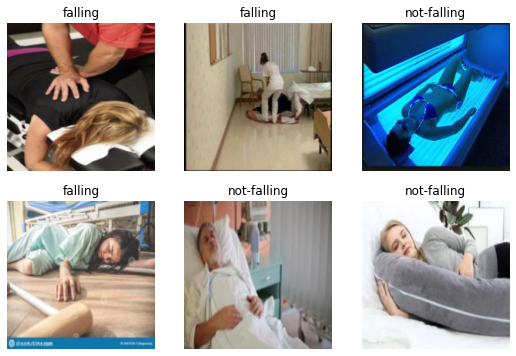

In [13]:
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=IndexSplitter(list(range(40))),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders('falling_or_not-after_correction/', bs=32)

dls.show_batch(max_n=6)

In [14]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,0.976655,0.008896,0.000000,01:11


epoch,train_loss,valid_loss,error_rate,time
0,0.408905,0.008183,0.000000,01:39
1,0.328173,0.018346,0.000000,01:38
2,0.264046,0.032768,0.000000,01:40


In [15]:
valid_set_falling = get_image_files('falling_or_not-after_correction/falling')[:40]
valid_set_not_falling = get_image_files('falling_or_not-after_correction/not-falling')[:40]

In [16]:
%matplotlib inline
import matplotlib.pyplot as plt

def test_all_images(valid_set):
  for img in valid_set:
    img = PILImage.create(img)
    is_falling, _, probs = learn.predict(img)
    plt.figure()
    plt.imshow(img)
    plt.xlabel(f'This patient is {is_falling}. Probability(falling): {probs[0]:.4f}')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


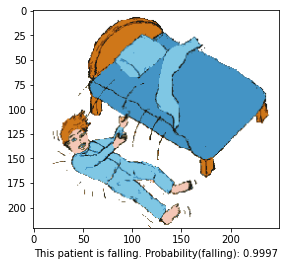

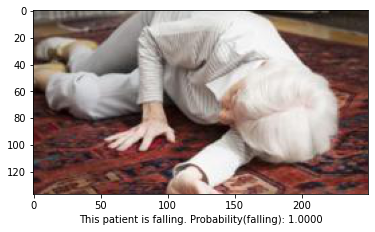

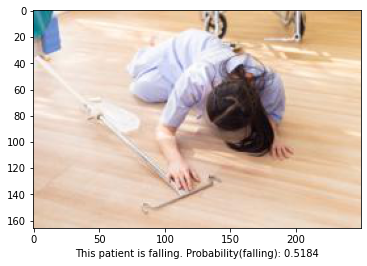

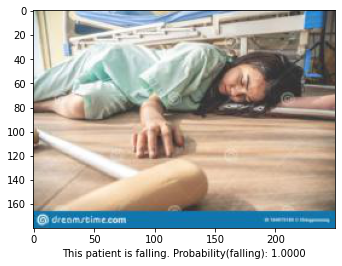

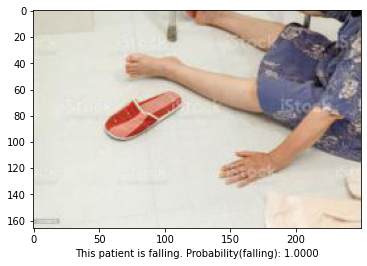

...

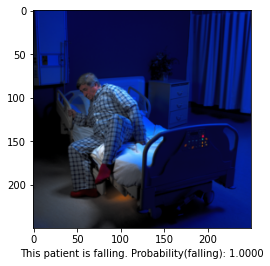

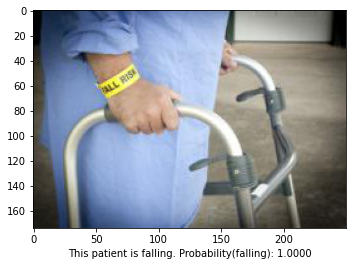

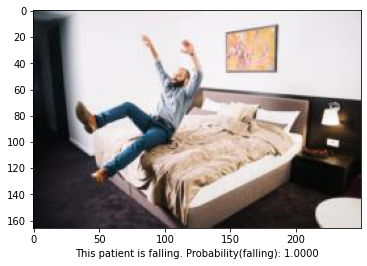

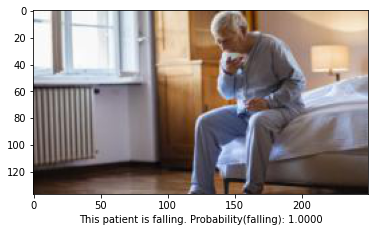

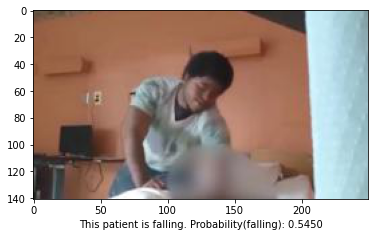

In [17]:
test_all_images(valid_set_falling)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


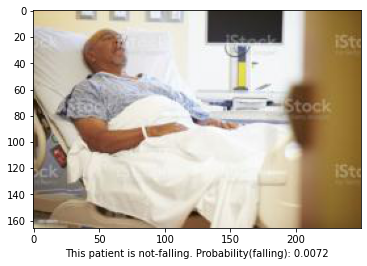

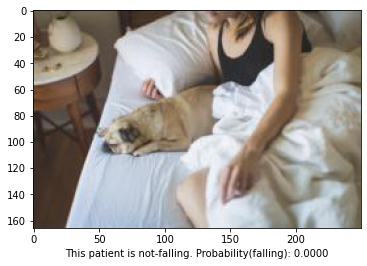

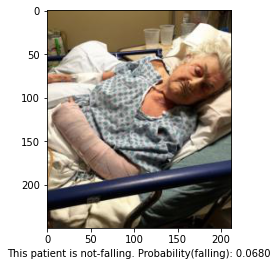

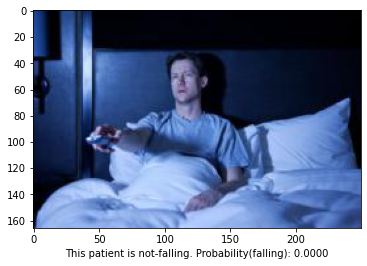

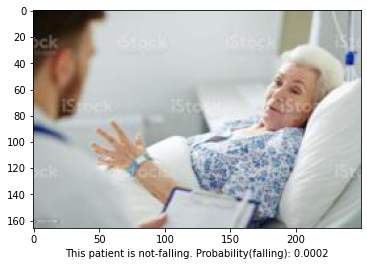

...

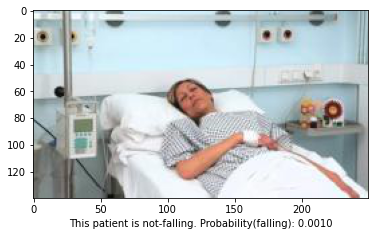

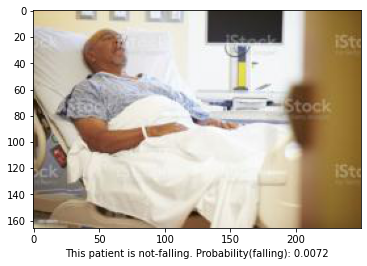

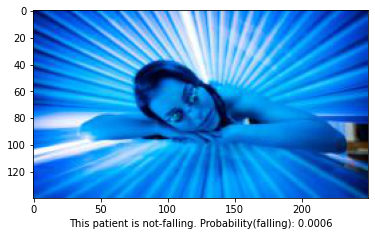

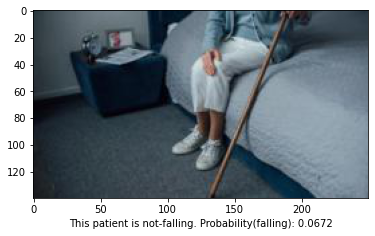

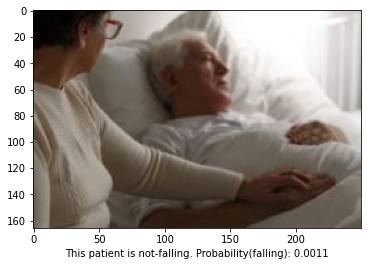

In [18]:
test_all_images(valid_set_not_falling)